# Working on Water Potability Data_Set

In [1]:
#link_dataset :https://www.kaggle.com/adityakadiwal/water-potability

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings("ignore")

In [3]:
#used for visulziation
import plotly.express as px
import plotly.io as pio

In [4]:
df =pd.read_csv("D:\\Saurabh\\Data_Science\\ML\\DATA_SET\\water_potability.csv")

In [5]:
df.head(5)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [6]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [8]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [9]:
df.shape

(3276, 10)

In [10]:
for col in df.columns:
    print('{} :NUll%:{}'.format(col,df[col].isnull().sum()/df[col].count()))

ph :NUll%:0.1763016157989228
Hardness :NUll%:0.0
Solids :NUll%:0.0
Chloramines :NUll%:0.0
Sulfate :NUll%:0.3130260521042084
Conductivity :NUll%:0.0
Organic_carbon :NUll%:0.0
Trihalomethanes :NUll%:0.05202312138728324
Turbidity :NUll%:0.0
Potability :NUll%:0.0


<AxesSubplot:>

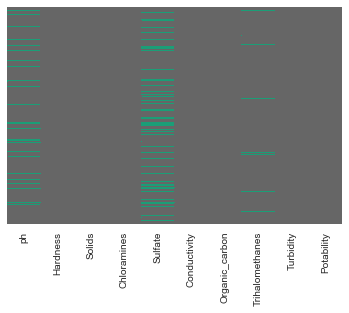

In [11]:
sns.heatmap(df.isnull(),cbar=False,yticklabels=False,cmap='Dark2_r')

<AxesSubplot:xlabel='ph', ylabel='Density'>

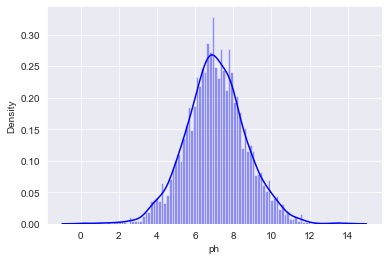

In [12]:
sns.distplot(df['ph'],kde=True,color='blue',bins=100)

<AxesSubplot:xlabel='Sulfate', ylabel='Density'>

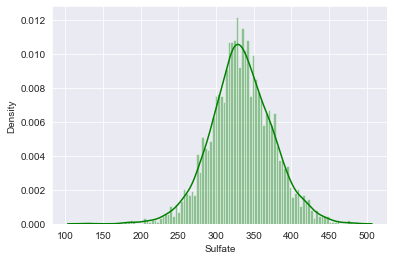

In [13]:
sns.distplot(df['Sulfate'],kde=True,color='green',bins=100)

<AxesSubplot:xlabel='Trihalomethanes', ylabel='Density'>

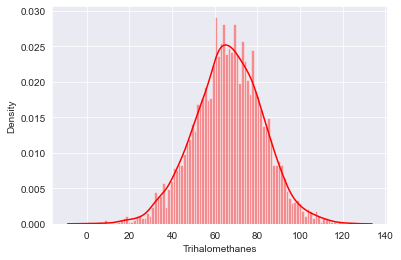

In [14]:
sns.distplot(df['Trihalomethanes'],kde=True,color='red',bins=100)

In [15]:
#more or less or the null valued columns are normally distributed so we can replcae the NAN

In [16]:
#making copy of df to data
data =df.copy()

In [17]:
#using fillna filling na with mean
data['ph'].fillna(data['ph'].mean(),inplace=True)
data['Sulfate'].fillna(data['Sulfate'].mean(),inplace=True)
data['Trihalomethanes'].fillna(data['Trihalomethanes'].mean(),inplace=True)

In [18]:
data.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [19]:
data.groupby(['Potability']).mean()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
Potability,,,,,,,,,
0,7.084658,196.733292,21777.490788,7.092175,334.371700,426.730454,14.364335,66.308522,3.965800
1,7.074754,195.800744,22383.991018,7.169338,332.844122,425.383800,14.160893,66.533513,3.968328


In [20]:
data.groupby(['Potability']).count()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
Potability,,,,,,,,,
0,1998,1998,1998,1998,1998,1998,1998,1998,1998
1,1278,1278,1278,1278,1278,1278,1278,1278,1278


In [21]:
data.head(5)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [22]:
Portable=data['Potability'].value_counts()
Portable

0    1998
1    1278
Name: Potability, dtype: int64

In [23]:
plt.figure(figsize=(15,8))
px.pie(data_frame=data,values=Portable,names=['Non_portable','Portable'],
       labels=['Non_portable','Portable'],title='Portability_Check',
       hole=0.5,color_discrete_sequence=['red','green'],width=600,height=500)

<Figure size 1080x576 with 0 Axes>

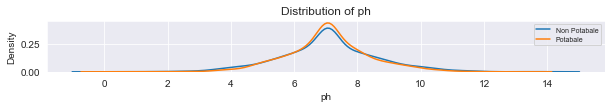

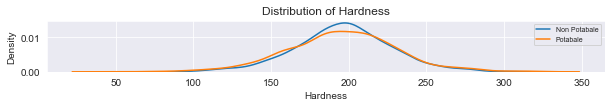

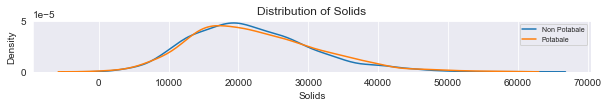

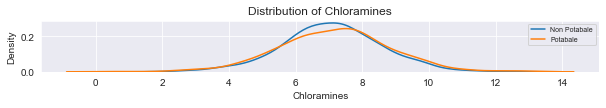

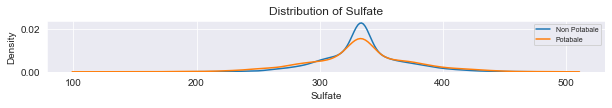

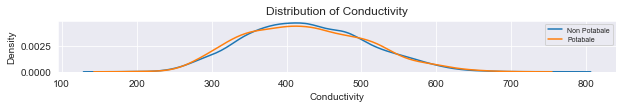

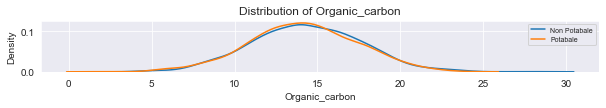

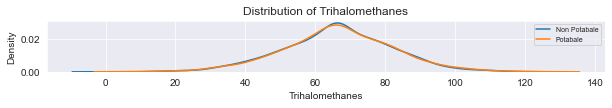

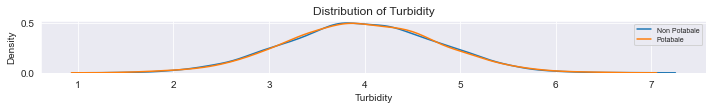

In [24]:
non_potabale = data.query('Potability == 0')
potabale     = data.query('Potability == 1')

for ax,col in enumerate(data.columns[:9]):
    plt.figure(figsize=(10,10))
    plt.subplot(9,1,ax+1)
    plt.title(f'Distribution of {col}')
    sns.kdeplot(x=non_potabale[col],label='Non Potabale')
    sns.kdeplot(x=potabale[col],label='Potabale')
    plt.legend(prop=dict(size=7))
    
plt.tight_layout()

In [25]:
data['Potability']=data['Potability'].astype('category')

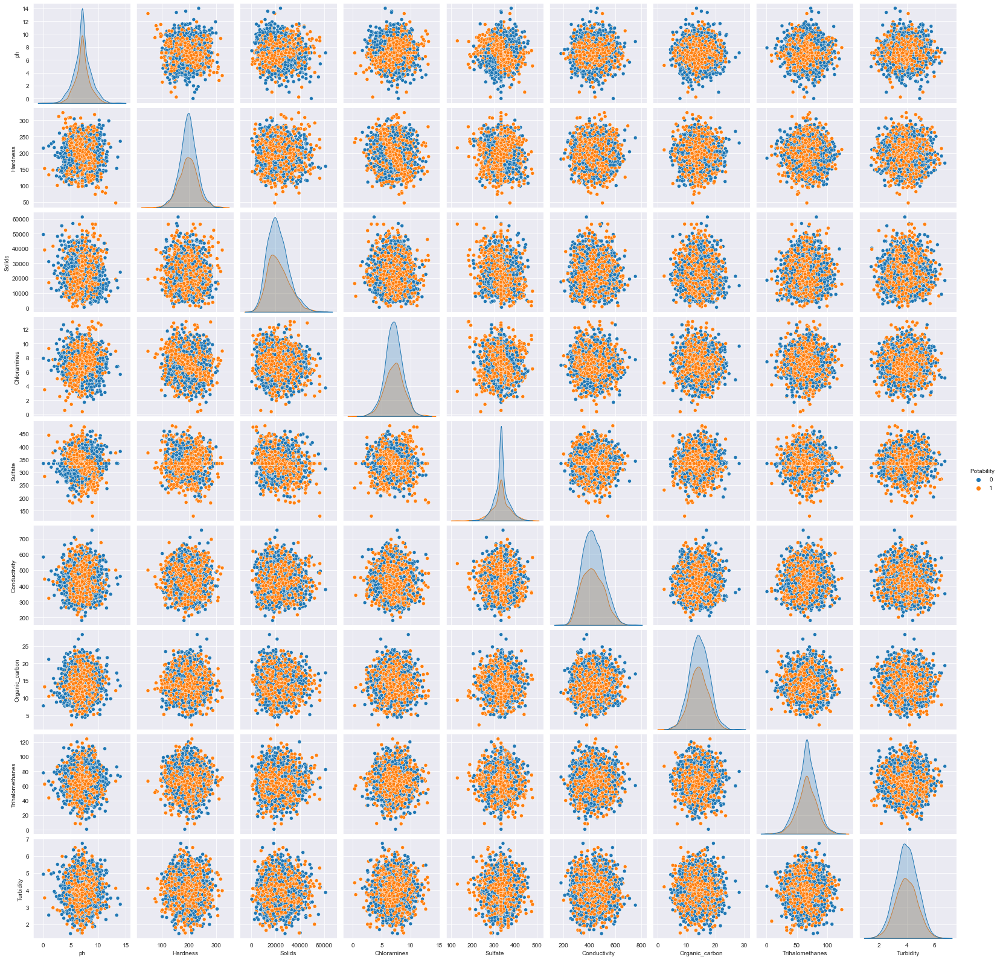

In [26]:
sns.pairplot(data,hue='Potability')

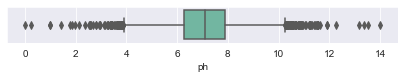

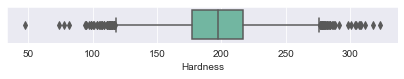

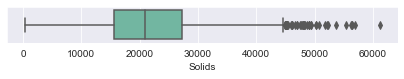

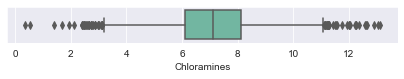

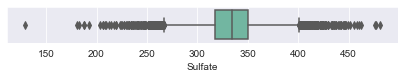

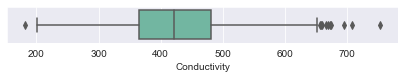

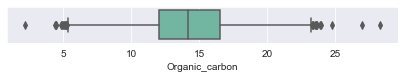

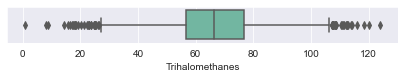

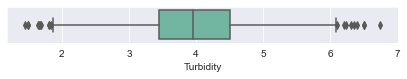

In [27]:
#outlier
for ax,col in enumerate(data.columns[:9]):
    plt.figure(figsize=(7,7))
    plt.subplot(9,1,ax+1)
    sns.boxplot(data[col],orient="v", palette="Set2",hue='Potability',data=data)

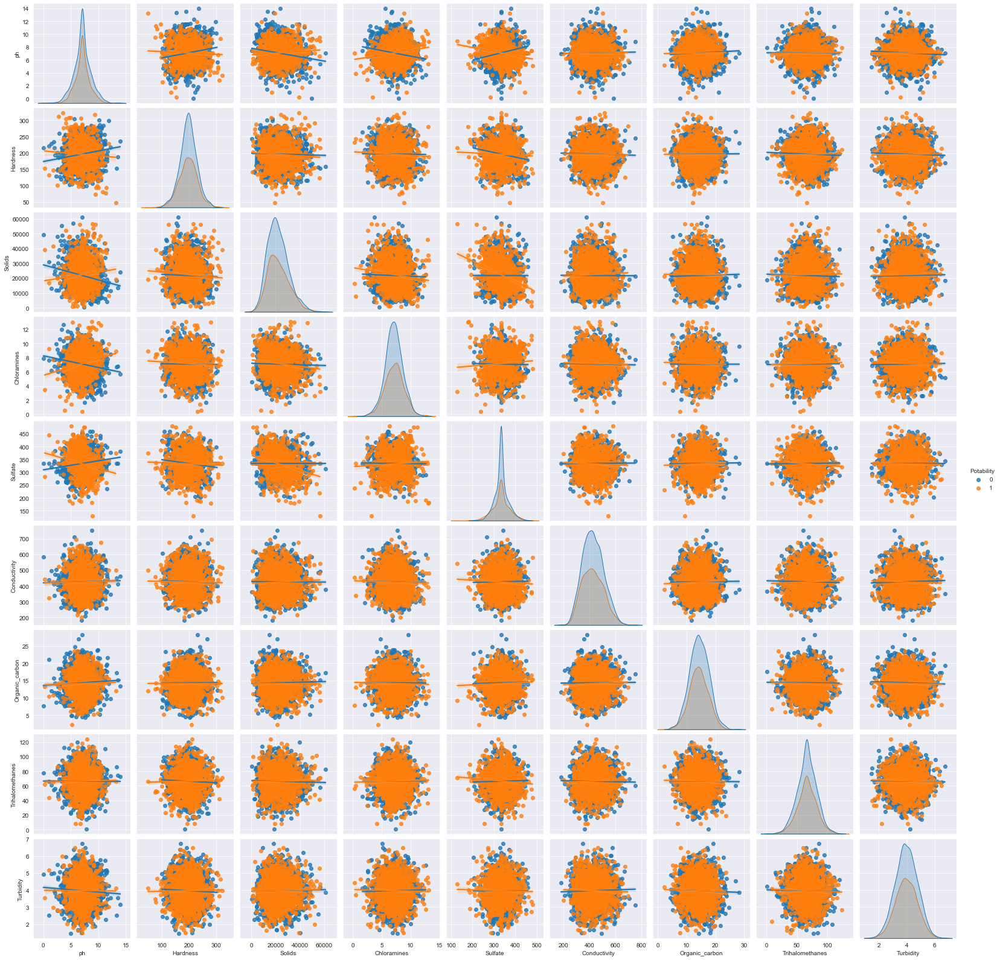

In [28]:
sns.pairplot(data,hue='Potability',kind='reg')

<AxesSubplot:>

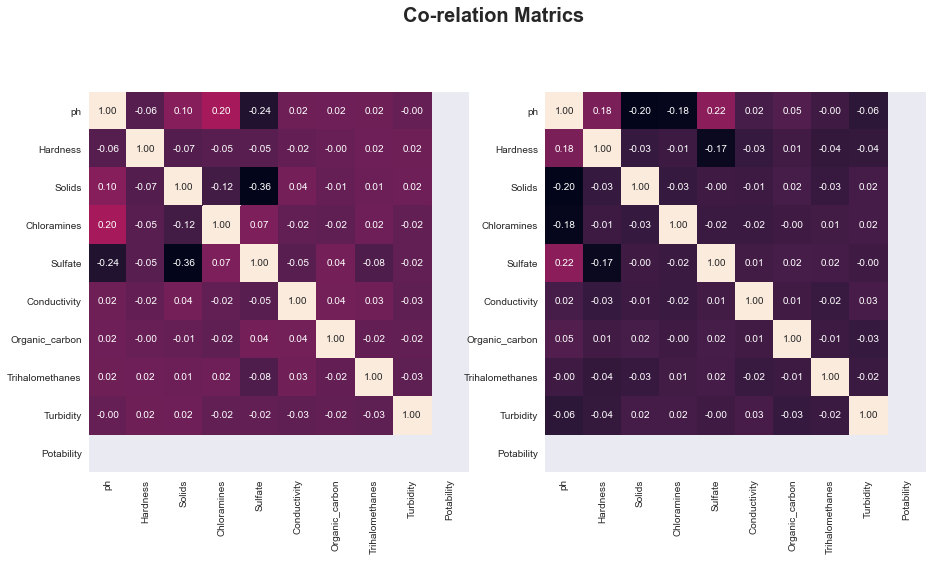

In [29]:
fig, ax=plt.subplots(nrows=1, ncols=2, figsize=(15,8))
plt.suptitle("Co-relation Matrics", size=20, weight='bold')
ax=ax.flatten()
sns.heatmap(df[df['Potability']==1].corr(), annot=True, square=True, fmt='.2f', ax=ax[0], cbar=False)
sns.heatmap(df[df['Potability']==0].corr(), annot=True, square=True, fmt='.2f', ax=ax[1], cbar=False)

<AxesSubplot:title={'center':'Co-relation Matrics:Pearson'}>

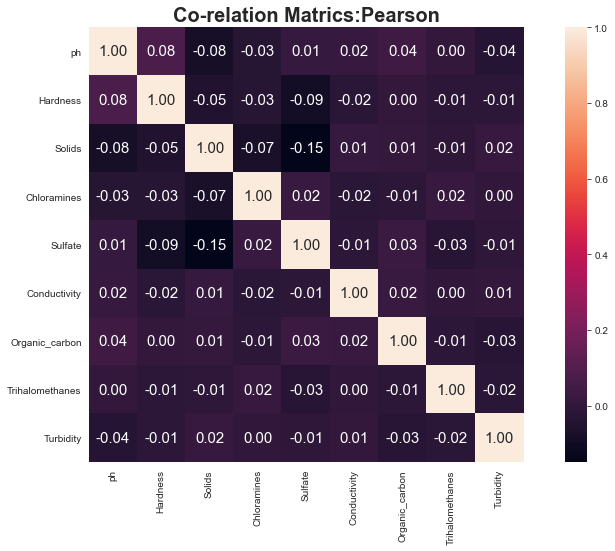

In [30]:
plt.figure(figsize=(15,8))
plt.title("Co-relation Matrics:Pearson", size=20, weight='bold')
sns.heatmap(data.corr('pearson'),cbar=True,square=True,annot =True,annot_kws={'size':15},fmt='.2f')

<AxesSubplot:title={'center':'Co-relation Matrics:Kendall'}>

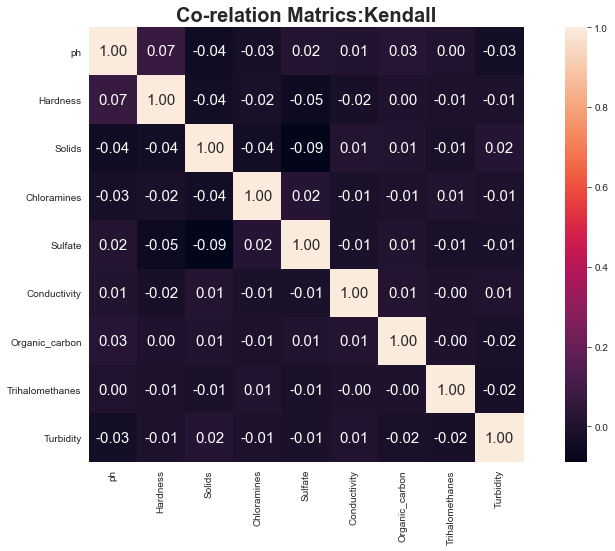

In [31]:
plt.figure(figsize=(15,8))
plt.title("Co-relation Matrics:Kendall", size=20, weight='bold')
sns.heatmap(data.corr('kendall'),cbar=True,square=True,annot =True,annot_kws={'size':15},fmt='.2f')

<AxesSubplot:title={'center':'Co-relation Matrics:Spearman'}>

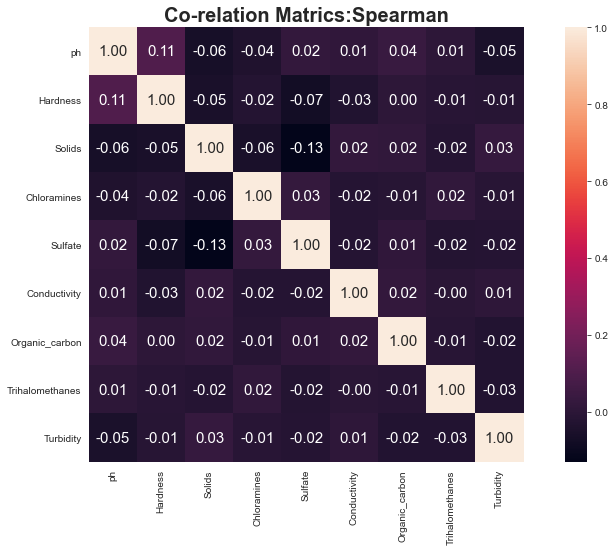

In [32]:
plt.figure(figsize=(15,8))
plt.title("Co-relation Matrics:Spearman", size=20, weight='bold')
sns.heatmap(data.corr('spearman'),cbar=True,square=True,annot =True,annot_kws={'size':15},fmt='.2f')

In [33]:
data.cov()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
ph,2.160771,3.665148,-1.055433e+03,-0.074026,0.765186,2.042492,0.194811,0.069405,-0.041551
Hardness,3.665148,1081.078715,-1.352149e+04,-1.564367,-110.239624,-63.552473,0.392670,-6.579802,-0.370747
Solids,-1055.432944,-13521.486526,7.688783e+07,-973.746052,-47487.109765,9802.117116,297.108377,-1227.205758,133.751106
Chloramines,-0.074026,-1.564367,-9.737461e+02,2.506158,1.361250,-2.621264,-0.066268,0.415084,0.002920
Sulfate,0.765186,-110.239624,-4.748711e+04,1.361250,1306.288414,-41.069488,3.217409,-14.593967,-0.276139
Conductivity,2.042492,-63.552473,9.802117e+03,-2.621264,-41.069488,6532.529330,5.605967,1.599718,0.365712
Organic_carbon,0.194811,0.392670,2.971084e+02,-0.066268,3.217409,5.605967,10.943936,-0.676942,-0.070499
Trihalomethanes,0.069405,-6.579802,-1.227206e+03,0.415084,-14.593967,1.599718,-0.676942,248.689155,-0.264610
Turbidity,-0.041551,-0.370747,1.337511e+02,0.002920,-0.276139,0.365712,-0.070499,-0.264610,0.608997


<AxesSubplot:title={'center':'Co-Varience Matrics(Pair_Wise)'}>

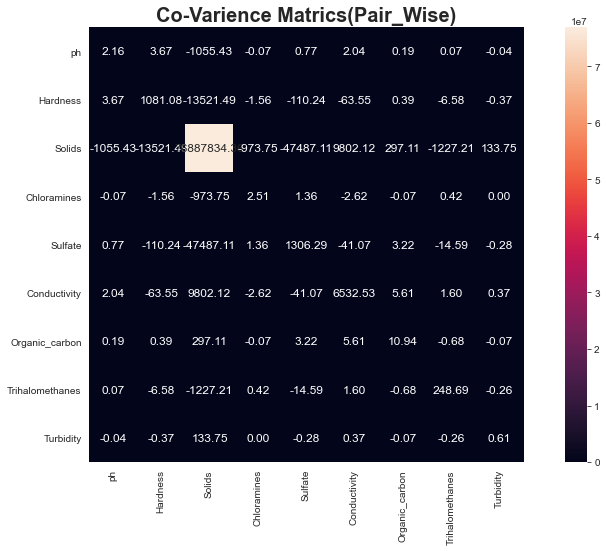

In [34]:
plt.figure(figsize=(15,8))
plt.title("Co-Varience Matrics(Pair_Wise)", size=20, weight='bold')
sns.heatmap(data.cov(),cbar=True,square=True,annot =True,annot_kws={'size':12},fmt='.2f')

#Distribution_of Data 

In [35]:
#volien polt
px.violin(data_frame=data,x='Potability',y='ph',color='Potability',title="Distribution_Plot[ph vs Potability]",box=True,points='all')

In [36]:
px.violin(data_frame=data,x='Potability',y='Hardness',color='Potability',title="Distribution_Plot[Hardness vs Potability]",box=True,points='all')

In [37]:
px.violin(data_frame=data,x='Potability',y='Solids',color='Potability',title="Distribution_Plot[Solids vs Potability]",box=True,points='all')

In [38]:
px.violin(data_frame=data,x='Potability',y='Chloramines',color='Potability',title="Distribution_Plot[Chloramines vs Potability]",box=True,points='all')

In [39]:
px.violin(data_frame=data,x='Potability',y='Sulfate',color='Potability',title="Distribution_Plot[Sulfate vs Potability]",box=True,points='all')

In [40]:
px.violin(data_frame=data,x='Potability',y='Conductivity',color='Potability',title="Distribution_Plot[Conductivity vs Potability]",box=True,points='all')

In [41]:
px.violin(data_frame=data,x='Potability',y='Organic_carbon',color='Potability',title="Distribution_Plot[Organic_carbon vs Potability]",box=True,points='all')

In [42]:
px.violin(data_frame=data,x='Potability',y='Trihalomethanes',color='Potability',title="Distribution_Plot[Trihalomethanes vs Potability]",box=True,points='all')

In [43]:
px.violin(data_frame=data,x='Potability',y='Turbidity',color='Potability',title="Distribution_Plot[Turbidity vs Potability]",box=True,points='all')

In [44]:
data.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [45]:
#desnity variation since we have seen that these have higher viration
px.scatter_matrix(data_frame=data,color='Potability',dimensions=['ph','Hardness','Sulfate','Chloramines'])

In [46]:
#importing important library
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
#import lightgbm as lg
from sklearn import metrics
from sklearn.model_selection import RandomizedSearchCV

In [47]:
#independent and dependent features distribution
X=data.iloc[:,:-1]
y=data.iloc[:,-1]

In [48]:
#shape of X and y
print("Shape_X_data:",X.shape)
print("Shape_Y_data:",y.shape)

Shape_X_data: (3276, 9)
Shape_Y_data: (3276,)


In [49]:
#sacling the data
Scaler =StandardScaler()
X_scale =Scaler.fit_transform(X)

In [50]:
#PCA
pca =PCA(n_components=2)
X_pca =pca.fit_transform(X_scale)
print('X_pca_Shape :',X_pca.shape)

X_pca_Shape : (3276, 2)


In [51]:
X_pca

array([[-6.21781541e-01,  7.39270183e-04],
       [ 7.60029987e-01,  2.41579897e+00],
       [-9.96211550e-01, -9.22698749e-01],
       ...,
       [ 2.78214238e-01, -3.80532454e-01],
       [ 3.32422502e-02,  2.86628444e-01],
       [-1.07940245e+00, -7.80194229e-01]])

Text(0, 0.5, '2nd_principle_component')

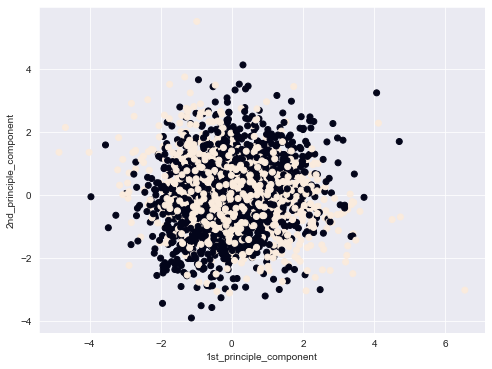

In [52]:
#plot after pca
plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0],X_pca[:,1],c=y)
plt.xlabel('1st_principle_component')
plt.ylabel('2nd_principle_component')

In [53]:
#train_test_split
X_train,X_test,y_train,y_test =train_test_split(X_pca,y,test_size=0.3,random_state=11)

In [54]:
print("Shape_X:",X_pca.shape)
print("Shape_X_train:",X_train.shape)
print("Shape_X_test:",X_test.shape)

Shape_X: (3276, 2)
Shape_X_train: (2293, 2)
Shape_X_test: (983, 2)


In [55]:
print("Shape_y:",y.shape)
print("Shape_y_train:",y_train.shape)
print("Shape_y_test:",y_test.shape)

Shape_y: (3276,)
Shape_y_train: (2293,)
Shape_y_test: (983,)


In [56]:
#pipeline
pipe_LR=Pipeline([('scaler1',StandardScaler()),
                 ('LR',LogisticRegression())])
pipe_SVC=Pipeline([('scaler2',StandardScaler()),
                    ('SVR',SVC())])
pipe_DT=Pipeline([('scaler3',StandardScaler()),
                  ('DTR',DecisionTreeClassifier())])
pipe_RF=Pipeline([('scaler4',StandardScaler()),
                  ('RFR',RandomForestClassifier())])
pipe_Knn=Pipeline([('scaler5',StandardScaler()),
                   ('Knn',KNeighborsClassifier())])
pipe_Xgboost=Pipeline([('scaler6',StandardScaler()),
                      ('Xgb',XGBClassifier())])
pipe_gbc=Pipeline([('scaler7',StandardScaler()),
                      ('GBC',GradientBoostingClassifier())])
pipe_ada=Pipeline([('scaler8',StandardScaler()),
                      ('ADA',AdaBoostClassifier())])

In [57]:
pipelines =[pipe_LR,pipe_SVC,pipe_DT,pipe_RF,pipe_Knn,pipe_Xgboost,pipe_gbc,pipe_ada]

In [58]:
pipe_dict={0:'Logistic_Regression',1:'SVM',2:'Descision_Tree',3:'Random_Tree',4:'KNeighbours',5:'Xgboost',6:'Gradient_boost',7:'Ada_boost'}

In [59]:
for pipe in pipelines:
    pipe.fit(X_train,y_train)

[00:39:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [60]:
for i,models in enumerate(pipelines):
  print('{} Accuracy : {}'.format(pipe_dict[i],models.score(X_test,y_test)))

Logistic_Regression Accuracy : 0.6083418107833164
SVM Accuracy : 0.6185147507629705
Descision_Tree Accuracy : 0.5656154628687691
Random_Tree Accuracy : 0.560528992878942
KNeighbours Accuracy : 0.5625635808748728
Xgboost Accuracy : 0.5615462868769074
Gradient_boost Accuracy : 0.6103763987792472
Ada_boost Accuracy : 0.6083418107833164


In [61]:
#optimising Knn

error_rate=[]
for i in range(1,50):
    model =KNeighborsClassifier(n_neighbors=i)
    model.fit(X_train,y_train)
    pred_i=model.predict(X_test)
    error_rate.append(np.mean(pred_i !=y_test))

Text(0, 0.5, 'Error Rate')

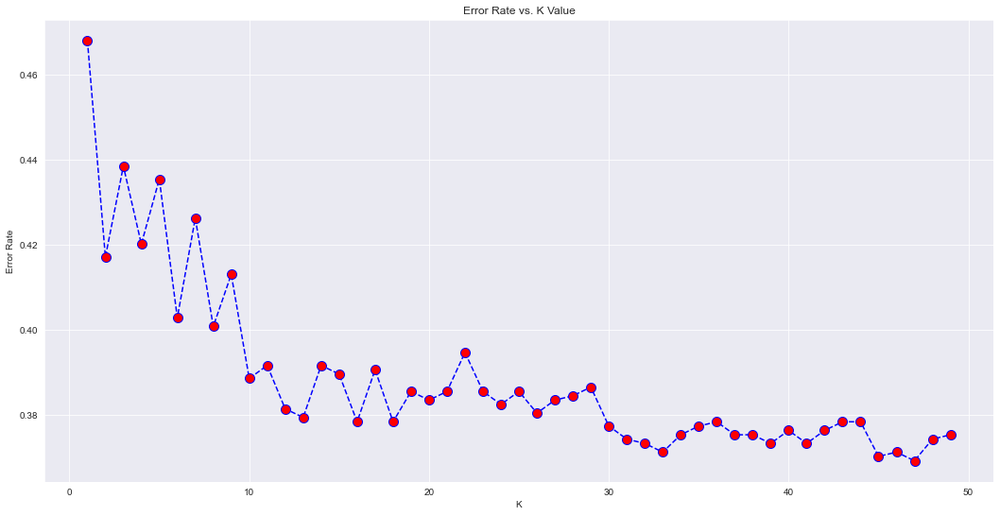

In [62]:
plt.figure(figsize=(18,9))
plt.plot(range(1,50),error_rate,color='blue', linestyle='dashed', marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [63]:
# n=47 give best result
model =KNeighborsClassifier(n_neighbors=47)
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("Accuracy_Score:",metrics.accuracy_score(y_test,y_pred))
print('Classification_report:\n',metrics.classification_report(y_test,y_pred))
print('Confusion_matrics:\n',metrics.confusion_matrix(y_test,y_pred))

Accuracy_Score: 0.6307222787385555
Classification_report:
               precision    recall  f1-score   support

           0       0.63      0.93      0.75       598
           1       0.60      0.17      0.26       385

    accuracy                           0.63       983
   macro avg       0.62      0.55      0.51       983
weighted avg       0.62      0.63      0.56       983

Confusion_matrics:
 [[555  43]
 [320  65]]


In [64]:
#hypertuning GB_Classifier
model =GradientBoostingClassifier()
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("Accuracy_Score:",metrics.accuracy_score(y_test,y_pred))
print('Classification_report:\n',metrics.classification_report(y_test,y_pred))
print('Confusion_matrics:\n',metrics.confusion_matrix(y_test,y_pred))

Accuracy_Score: 0.6103763987792472
Classification_report:
               precision    recall  f1-score   support

           0       0.63      0.90      0.74       598
           1       0.51      0.17      0.25       385

    accuracy                           0.61       983
   macro avg       0.57      0.53      0.49       983
weighted avg       0.58      0.61      0.55       983

Confusion_matrics:
 [[536  62]
 [321  64]]


In [65]:
sorted(model.get_params().keys())

['ccp_alpha',
 'criterion',
 'init',
 'learning_rate',
 'loss',
 'max_depth',
 'max_features',
 'max_leaf_nodes',
 'min_impurity_decrease',
 'min_impurity_split',
 'min_samples_leaf',
 'min_samples_split',
 'min_weight_fraction_leaf',
 'n_estimators',
 'n_iter_no_change',
 'random_state',
 'subsample',
 'tol',
 'validation_fraction',
 'verbose',
 'warm_start']

In [66]:
#prams init
#randomised cv
params={
    'criterion':['mse','mae','friedman_mse'],
    'loss':['deviance', 'exponential'],
    'n_estimators':[int(x) for x in np.linspace(50,800,10)],
    'max_depth':[int(x) for x in np.linspace(10,100,10)],
    'max_features':['auto','sqrt','log2'],
    'min_samples_split':[int(x) for x in np.linspace(2,20,2)],
    'max_leaf_nodes':[int(x) for x in np.linspace(5,50,5)],
    'learning_rate':[0.02,0.03,0.05,0.1,0.025,0.08]
    
}

In [67]:
#random_search_cv
random_search_cv=RandomizedSearchCV(model,param_distributions=params,n_iter=5,n_jobs=1,cv=5,verbose=3)

In [68]:
random_search_cv.fit(X_train,y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5] END criterion=mae, learning_rate=0.03, loss=exponential, max_depth=60, max_features=sqrt, max_leaf_nodes=16, min_samples_split=20, n_estimators=50; total time=   2.7s
[CV 2/5] END criterion=mae, learning_rate=0.03, loss=exponential, max_depth=60, max_features=sqrt, max_leaf_nodes=16, min_samples_split=20, n_estimators=50; total time=   2.3s
[CV 3/5] END criterion=mae, learning_rate=0.03, loss=exponential, max_depth=60, max_features=sqrt, max_leaf_nodes=16, min_samples_split=20, n_estimators=50; total time=   2.9s
[CV 4/5] END criterion=mae, learning_rate=0.03, loss=exponential, max_depth=60, max_features=sqrt, max_leaf_nodes=16, min_samples_split=20, n_estimators=50; total time=   2.6s
[CV 5/5] END criterion=mae, learning_rate=0.03, loss=exponential, max_depth=60, max_features=sqrt, max_leaf_nodes=16, min_samples_split=20, n_estimators=50; total time=   2.4s
[CV 1/5] END criterion=mae, learning_rate=0.03, loss=devianc

RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_iter=5,
                   n_jobs=1,
                   param_distributions={'criterion': ['mse', 'mae',
                                                      'friedman_mse'],
                                        'learning_rate': [0.02, 0.03, 0.05, 0.1,
                                                          0.025, 0.08],
                                        'loss': ['deviance', 'exponential'],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'max_leaf_nodes': [5, 16, 27, 38, 50],
                                        'min_samples_split': [2, 20],
                                        'n_estimators': [50, 133, 216, 300, 383,
        

In [69]:
random_search_cv.best_params_

{'n_estimators': 50,
 'min_samples_split': 20,
 'max_leaf_nodes': 16,
 'max_features': 'sqrt',
 'max_depth': 60,
 'loss': 'exponential',
 'learning_rate': 0.03,
 'criterion': 'mae'}

In [70]:
best_est=random_search_cv.best_estimator_
best_est

GradientBoostingClassifier(criterion='mae', learning_rate=0.03,
                           loss='exponential', max_depth=60,
                           max_features='sqrt', max_leaf_nodes=16,
                           min_samples_split=20, n_estimators=50)

In [71]:
model =GradientBoostingClassifier(learning_rate=0.3, loss='exponential', max_depth=120,
                           max_features='sqrt', max_leaf_nodes=5,
                           n_estimators=150)
model.fit(X_train,y_train)
y_pred=model.predict(X_test)

In [72]:
print("Accuracy_Score:",metrics.accuracy_score(y_test,y_pred))
print('Classification_report:\n',metrics.classification_report(y_test,y_pred))

Accuracy_Score: 0.595116988809766
Classification_report:
               precision    recall  f1-score   support

           0       0.63      0.82      0.71       598
           1       0.47      0.25      0.33       385

    accuracy                           0.60       983
   macro avg       0.55      0.53      0.52       983
weighted avg       0.57      0.60      0.56       983



In [73]:
from sklearn.model_selection import GridSearchCV

In [74]:
param_grid = {
    'criterion': [random_search_cv.best_params_['criterion']],
    'max_depth': [random_search_cv.best_params_['max_depth']],
    'max_features': [random_search_cv.best_params_['max_features']],
    'max_leaf_nodes': [random_search_cv.best_params_['max_leaf_nodes'], 
                         random_search_cv.best_params_['max_leaf_nodes']+2, 
                         random_search_cv.best_params_['max_leaf_nodes'] + 4],
    'min_samples_split': [random_search_cv.best_params_['min_samples_split'] - 2,
                          random_search_cv.best_params_['min_samples_split'] - 1,
                          random_search_cv.best_params_['min_samples_split'], 
                          random_search_cv.best_params_['min_samples_split'] +1,
                          random_search_cv.best_params_['min_samples_split'] + 2],
    'n_estimators': [random_search_cv.best_params_['n_estimators'] - 200, random_search_cv.best_params_['n_estimators'] - 100, 
                     random_search_cv.best_params_['n_estimators'], 
                     random_search_cv.best_params_['n_estimators'] + 100, random_search_cv.best_params_['n_estimators'] + 200],
    'learning_rate':[0.02,0.03,0.05,0.1,0.025,0.08]
}

print(param_grid)

{'criterion': ['mae'], 'max_depth': [60], 'max_features': ['sqrt'], 'max_leaf_nodes': [16, 18, 20], 'min_samples_split': [18, 19, 20, 21, 22], 'n_estimators': [-150, -50, 50, 150, 250], 'learning_rate': [0.02, 0.03, 0.05, 0.1, 0.025, 0.08]}


In [ ]:
#left to work on others parts